<a href="https://colab.research.google.com/github/MohamedHussienMansour/Yolo-v8-for-vehicle-detection/blob/main/Copy_of_YOLO_v8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
alkanerturan_vehicledetection_path = kagglehub.dataset_download('alkanerturan/vehicledetection')

print('Data source import complete.')


Using Colab cache for faster access to the 'vehicledetection' dataset.
Data source import complete.


In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 772.7/772.7 kB 52.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 MB 42.5 MB/s eta 0:00:00


In [3]:
import os
import cv2
import glob
import yaml
import random
import pathlib
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
from tqdm import tqdm
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm.notebook import trange, tqdm
from IPython.display import Image, Video
from IPython.display import Image, display
from sklearn.metrics import precision_score, recall_score
!wandb disabled
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
/bin/bash: line 1: wandb: command not found


In [4]:
import os
import cv2
import numpy as np

def load_yolo_dataset(base_path):
    data = {"images": [], "bboxes": [], "labels": []}

    images_path = os.path.join(base_path, "images")
    labels_path = os.path.join(base_path, "labels")

    for img_file in os.listdir(images_path):
        if not img_file.endswith(('.jpg', '.png', '.jpeg')):
            continue

        img_path = os.path.join(images_path, img_file)
        label_path = os.path.join(labels_path, img_file.replace('.jpg', '.txt').replace('.png', '.txt'))

        img = cv2.imread(img_path)
        img_h, img_w = img.shape[:2]

        boxes, classes = [], []

        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f.readlines():
                    cls, x, y, w, h = map(float, line.strip().split())
                    # Convert from normalized center format → pixel coordinates
                    x_min = int((x - w / 2) * img_w)
                    y_min = int((y - h / 2) * img_h)
                    x_max = int((x + w / 2) * img_w)
                    y_max = int((y + h / 2) * img_h)
                    boxes.append([x_min, y_min, x_max, y_max])
                    classes.append(int(cls))

        data["images"].append(img)
        data["bboxes"].append(np.array(boxes))
        data["labels"].append(np.array(classes))

    return data
Base_Path=alkanerturan_vehicledetection_path+"/VehiclesDetectionDataset/"
# Example usage
train_data = load_yolo_dataset(Base_Path+"train")
valid_data = load_yolo_dataset(Base_Path+"valid")
test_data = load_yolo_dataset(Base_Path+"test")

print(f"Loaded {len(train_data['images'])} training images.")


Loaded 878 training images.


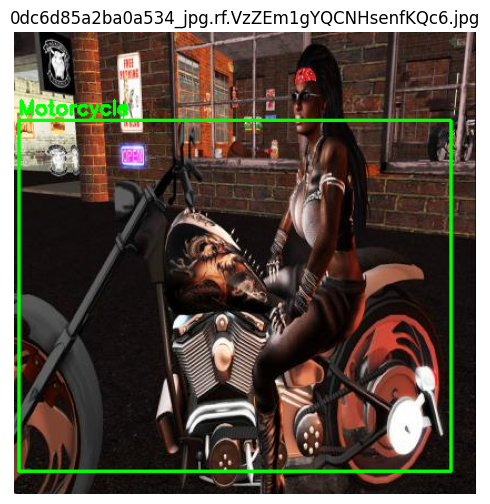

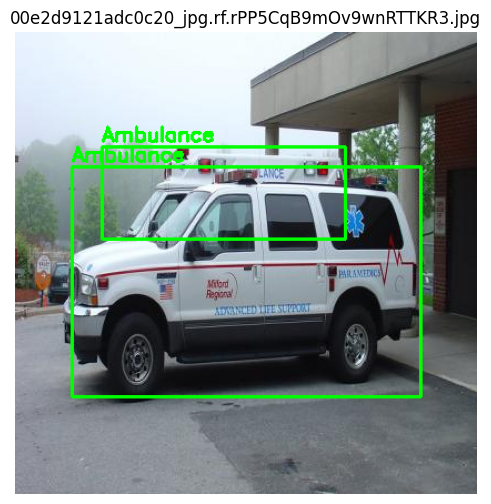

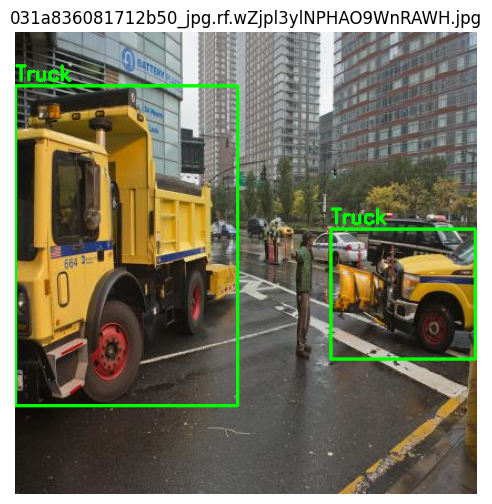

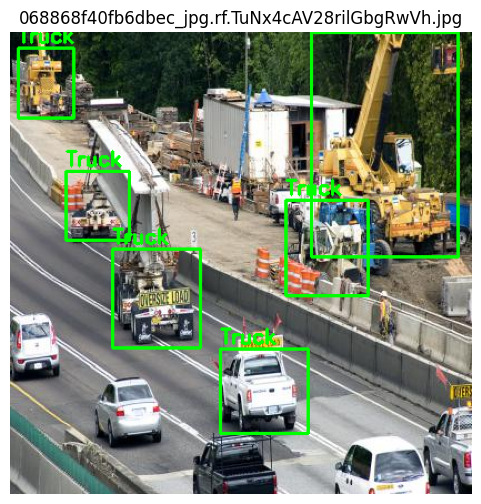

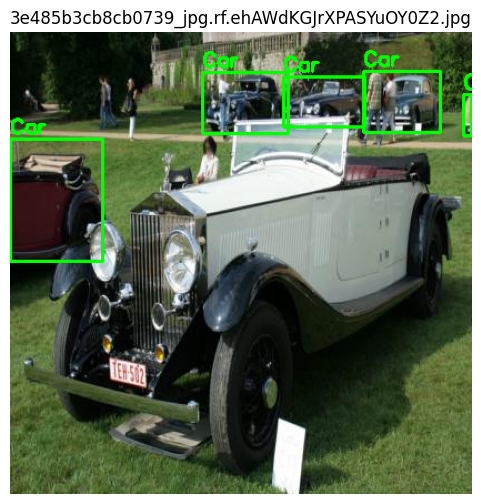

In [5]:
import os
import cv2
import matplotlib.pyplot as plt

# Paths
root = alkanerturan_vehicledetection_path+"/VehiclesDetectionDataset/train"
img_dir = os.path.join(root, "images")
label_dir = os.path.join(root, "labels")

# Class names (same as in YAML)
names = ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']

# Get some image files
image_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Display a few images with labels
for img_file in image_files[:5]:
    img_path = os.path.join(img_dir, img_file)
    label_path = os.path.join(label_dir, img_file.replace('.jpg', '.txt').replace('.png', '.txt'))

    img = cv2.imread(img_path)
    if img is None:
        print(f"❌ Could not read {img_path}")
        continue

    h, w, _ = img.shape

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                cls, x, y, bw, bh = map(float, line.strip().split())
                cls = int(cls)

                # Convert YOLO format (normalized cx, cy, w, h) → pixel coordinates
                x1 = int((x - bw / 2) * w)
                y1 = int((y - bh / 2) * h)
                x2 = int((x + bw / 2) * w)
                y2 = int((y + bh / 2) * h)

                # Draw bounding box
                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                cv2.putText(img, names[cls], (x1, y1 - 5),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Convert BGR to RGB for display
    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(img_file)
    plt.show()


In [6]:
from ultralytics import YOLO

train_path = alkanerturan_vehicledetection_path+'/VehiclesDetectionDataset/train/images'
val_path = alkanerturan_vehicledetection_path+'/VehiclesDetectionDataset/valid/images'
test_path = alkanerturan_vehicledetection_path+'/VehiclesDetectionDataset/test/images'

yaml_content = f"""
test: {test_path}
train: {train_path}
val: {val_path}

nc: 5  # Number of classes
names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']
"""
output_path = 'vehicles.yaml'
with open(output_path, "w") as f:
    f.write(yaml_content)

# Load dataset using YOLO
model = YOLO('yolov8n.pt')  # or your own architecture



In [7]:
color_code = "\033[38;2;163;196;243m"
reset_code = "\033[0m"
print(f"{color_code}YAML file has been saved to {output_path}{reset_code}")

YAML file has been saved to vehicles.yaml


In [8]:
import yaml
with open(output_path, 'r') as file:
    data = yaml.safe_load(file)
class_names = data['names']
print(f"{color_code}Class Names:{reset_code} {class_names}")

Class Names: ['Ambulance', 'Bus', 'Car', 'Motorcycle', 'Truck']


📸 Random Image: cb4e0dac761c5e79_jpg.rf.3f328815a9791328053b98a2cf76dc5c.jpg
Size (Width x Height): 416 x 416
Number of Channels: 3
Image Mode: RGB


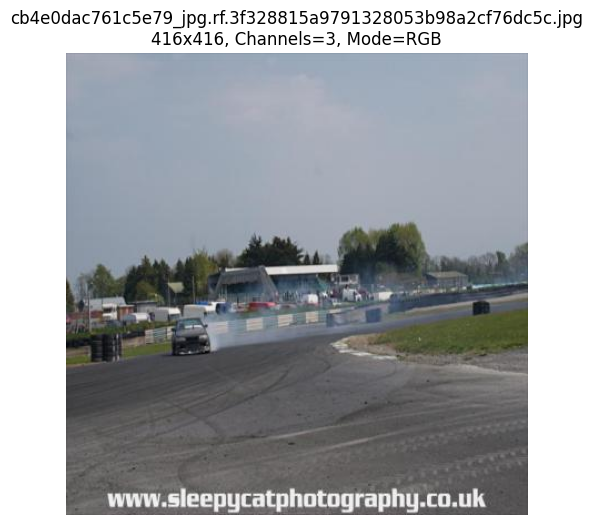

In [9]:
import os
import random
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Path to your training images
img_dir = train_path

# Pick a random image
image_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
random_img = random.choice(image_files)
img_path = os.path.join(img_dir, random_img)

# --- Using OpenCV ---
img_cv = cv2.imread(img_path)
if img_cv is None:
    raise ValueError(f"Could not read image: {img_path}")

h, w, c = img_cv.shape  # height, width, channels
print(f"📸 Random Image: {random_img}")
print(f"Size (Width x Height): {w} x {h}")
print(f"Number of Channels: {c}")

# --- Using PIL ---
img_pil = Image.open(img_path)
print(f"Image Mode: {img_pil.mode}")  # e.g., RGB, L (grayscale), RGBA

# --- Show the image ---
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
plt.title(f"{random_img}\n{w}x{h}, Channels={c}, Mode={img_pil.mode}")
plt.axis("off")
plt.show()


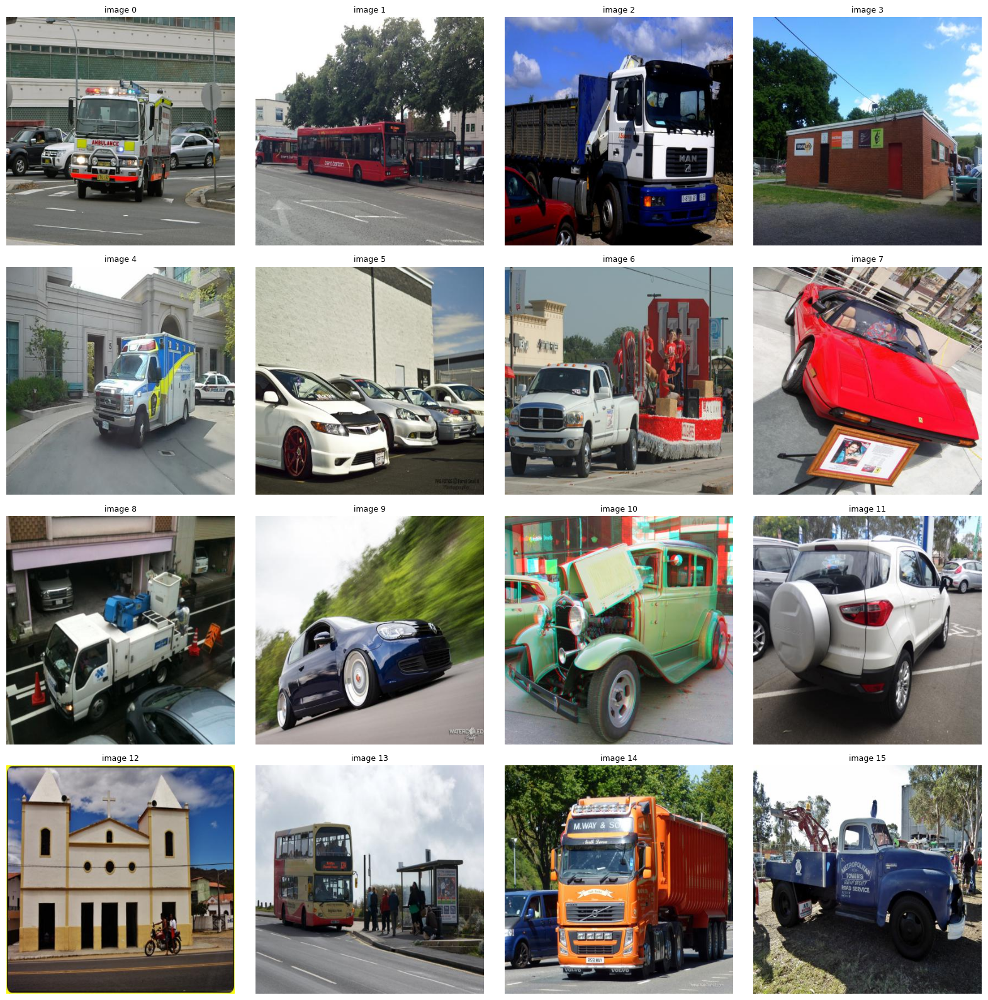

In [10]:
import os
import random
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Path to your images
img_dir = train_path

# Get all image files
image_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Select 16 random images
random_imgs = random.sample(image_files, 16)

# Create a 4x4 subplot
plt.figure(figsize=(16, 16))

for i, img_file in enumerate(random_imgs):
    img_path = os.path.join(img_dir, img_file)

    # Read with OpenCV
    img_cv = cv2.imread(img_path)
    if img_cv is None:
        print(f"⚠️ Could not read {img_path}")
        continue

    h, w, c = img_cv.shape  # dimensions
    img_pil = Image.open(img_path)

    # Plot
    plt.subplot(4, 4, i + 1)
    plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"image {i}", fontsize=9)

plt.tight_layout()
plt.show()


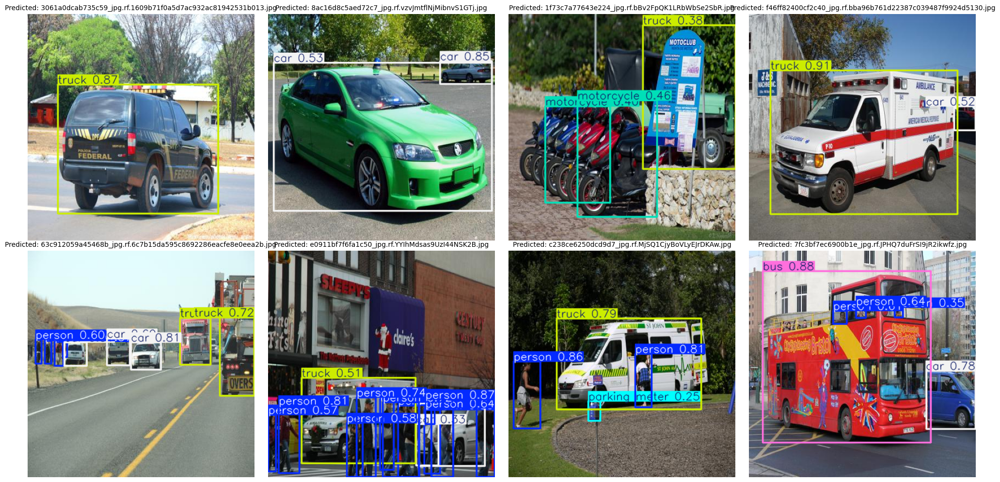

In [11]:
import os
import random
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2

# Load your trained YOLOv8 model
# (use your trained weights, e.g. 'runs/detect/train/weights/best.pt')
model = YOLO("yolov8n.pt")

# Dataset path (test images folder)
dataset_path = train_path

# Get image list
image_files = [f for f in os.listdir(dataset_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Pick random 8 samples
random_imgs = random.sample(image_files, 8)

# Create subplots (2 rows × 4 columns)
plt.figure(figsize=(20, 10))

for i, img_file in enumerate(random_imgs):
    img_path = os.path.join(dataset_path, img_file)

    # Run YOLO prediction
    results = model.predict(source=img_path, conf=0.25, verbose=False)

    # Plot results with bounding boxes
    result_img = results[0].plot()  # draws boxes, labels, etc.
    result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

    # Show image
    plt.subplot(2, 4, i + 1)
    plt.imshow(result_img)
    plt.title(f"Predicted: {img_file}", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [12]:
from ultralytics import YOLO

# Load YOLOv8n (you can also use 'yolov8s.pt', 'yolov8m.pt', etc.)
model = YOLO('yolov8n.pt')

# Train model
results = model.train(
    data='/content/vehicles.yaml',  # path to YAML file
    epochs=50,                 # number of epochs
    imgsz=416,                 # image size
    batch=16,                  # batch size
    name='vehicle_yolov8_train',  # experiment name
    project='/kaggle/working',    # save results here
)


Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vehicles.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=vehicle_yolov8_train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.

In [13]:
# Evaluate on validation set
metrics = model.val()
print(metrics)


Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.4 ms, read: 92.9±15.5 MB/s, size: 31.3 KB)
val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid/labels... 250 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 250/250 1.1Kit/s 0.2s
WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 16/16 2.2it/s 7.1s
                   all        250        454      0.617      0.566      0.597      0.452
             Ambulance         50         64      0.756      0.812      0.856      0.739
                   Bus         30         46      0.573      0.652      0.653      0.542
                   Car         90        238      0.658      0.378      0.466  

In [16]:
results = model.val(
    data='/content/vehicles.yaml',
    split='test',     # evaluate on test split
    imgsz=640,
    conf=0.25
)

# Print metrics summary
print("Precision:", results.box.map50)
print("mAP@50:", results.box.map50)
print("mAP@50-95:", results.box.map)


Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cpu CPU (AMD EPYC 7B13)
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 97.6±38.5 MB/s, size: 30.1 KB)
val: Scanning /kaggle/input/vehicledetection/VehiclesDetectionDataset/test/labels... 126 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 126/126 2.0Kit/s 0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/vehicledetection/VehiclesDetectionDataset/test is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.0it/s 8.4s
                   all        126        258      0.716      0.643      0.703      0.471
             Ambulance         18         18        0.9          1      0.995      0.835
                   Bus         22         38      0.688      0.579      0.707      0.425
                   Car         60        150      0.744       0.56      0.644       0.42
            Motorcycle         12         32      0.375      0.375      0.

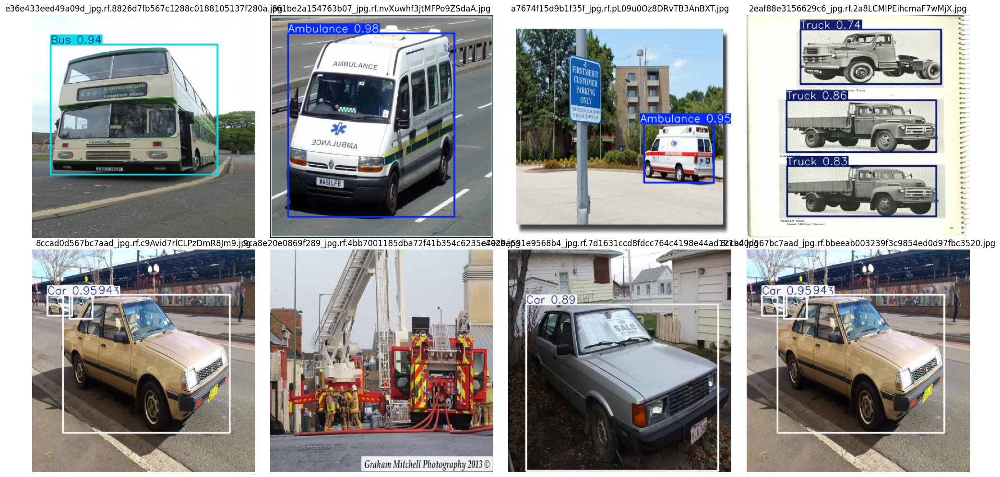

In [14]:
import matplotlib.pyplot as plt
import cv2, random, os

# Path to test images
test_path = "/kaggle/input/vehicledetection/VehiclesDetectionDataset/test/images"

image_files = [f for f in os.listdir(test_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
sample_imgs = random.sample(image_files, 8)

plt.figure(figsize=(20, 10))

for i, f in enumerate(sample_imgs):
    img_path = os.path.join(test_path, f)
    results = model.predict(source=img_path, conf=0.25, verbose=False)
    pred_img = results[0].plot()
    pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 4, i + 1)
    plt.imshow(pred_img)
    plt.title(f)
    plt.axis("off")

plt.tight_layout()
plt.show()
